# Import packages

In [1]:
import os
import random
import pandas as pd
import numpy as np
import cv2
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

import matplotlib
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import Sequential
from tensorflow.keras import regularizers, layers

2024-03-20 16:59:33.864437: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-20 16:59:33.864540: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-20 16:59:33.976504: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Setup datasets

In [2]:
IMG_SIZE = 224
HIDDEN_LAYERS = [256, 256, 128]
USE_HIDDEN_LAYERS = True
USE_AUGUMENTATION = True
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
BATCH_SIZE = 16
EPOCHS = 100

In [3]:
dataset_name = "skin-cancer"
dataset_paths = [
    '/kaggle/input/skin-cancer-detection/Skin cancer ISIC The International Skin Imaging Collaboration'
]

In [4]:
EXPERIMENTS_CLASSES = '__all__'
# encode_labels = {
#     'actinic keratosis': "actinic keratosis",
#     'dermatofibroma': "dermatofibroma",
#     'vascular lesion': "vascular lesion",
#     'nevus': "nevus",
#     'pigmented benign keratosis': "pigmented keratosis",
#     'seborrheic keratosis': "seborrheic",
#     'squamous cell carcinoma': "squamous cell",
#     'basal cell carcinoma': "basal cell",
#     'melanoma': "melanoma",
# }
encode_labels = {
    'actinic keratosis': "benign",
    'dermatofibroma': "benign",
    'vascular lesion': "benign",
    'nevus': "benign",
    'pigmented benign keratosis': "benign",
    'seborrheic keratosis': "benign",
    'squamous cell carcinoma': "malignant",
    'basal cell carcinoma': "malignant",
    'melanoma': "malignant",
}

In [5]:
from collections import defaultdict
from tqdm import tqdm

data_dict = defaultdict(list)
error_count = 0
image_paths = []
images = []
labels = []

limit = 500
# Spliting by my self later
for path in dataset_paths:
    for dirpath, _, filenames in os.walk(path):
        for filename in tqdm(filenames):
            label = dirpath.split('/')[-1]
            if label not in encode_labels: continue 
            label = encode_labels[label]
            if len(data_dict[label]) > limit: continue
            try:
                path = os.path.join(dirpath, filename)
                image = cv2.imread(path) # Check for no error
                image = cv2.resize(image, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                
                data_dict[label].append(image)
                image_paths.append(path)
                images.append(image)
                labels.append(label)
            except:
#                 print('ERROR: ', filename)
                error_count += 1

print("ErrorCount: ", error_count)

0it [00:00, ?it/s]
0it [00:00, ?it/s]
100%|██████████| 16/16 [00:00<00:00, 48.44it/s]
0it [00:00, ?it/s]
100%|██████████| 357/357 [00:00<00:00, 455264.98it/s]

ErrorCount:  0


Text(0.5, 1.0, '\nThe Count of images in each labels\n')

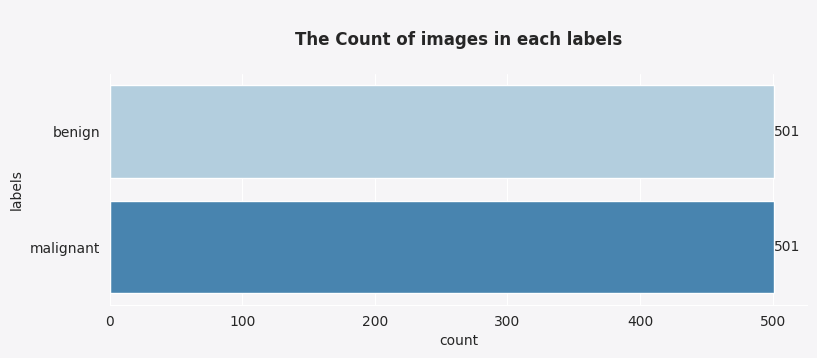

In [6]:
fig, ax=plt.subplots(figsize=(9,3))
fig.patch.set_facecolor("#f6f5f7")
ax.set_facecolor("#f6f5f7")

for i in ["top","right"]:
    ax.spines[i].set_visible(False)

x = sns.countplot(y=pd.Series(labels, name="labels"), palette='Blues')
for container in x.containers:
    x.bar_label(container)
    
plt.title("\nThe Count of images in each labels\n", weight="bold")

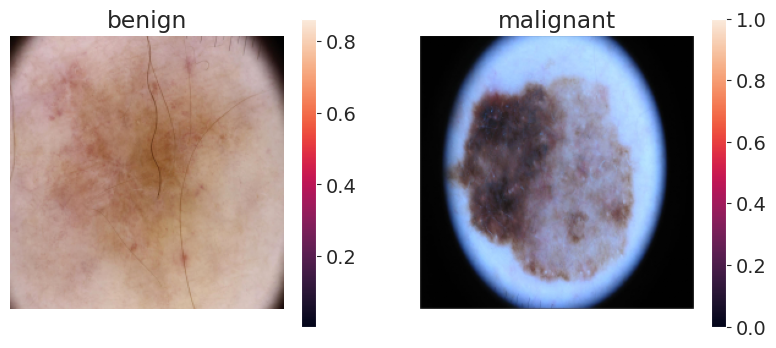

In [7]:
import math
plt.rcParams.update({'font.size': 14})

def visualize_datasets(images, labels, k=4, cols=4, seed=42):
    # visualize datasets

    if k > len(images): k = len(images)
    fig = plt.figure(figsize=(5 * cols, 4))
    rows = math.ceil(k / cols)

    for i in range(k):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.title.set_text(labels[i])
        plt.imshow(images[i] / 255)
        plt.colorbar()
        plt.axis('off')

    plt.show()

sample_images = [data_dict[k][0] for k in data_dict]
visualize_datasets(sample_images, list(data_dict.keys()), k=len(data_dict), cols=3)

# Data augumentation

In [8]:
img_augmentation_layers = [
    layers.RandomRotation(factor=0.8),
    layers.RandomFlip(),
    layers.RandomZoom(0.1)
]

def img_augmentation(images, k=1):
    
    results = []
    for i in range(k):
        x = images
        for layer in img_augmentation_layers:
            x = layer(x)
        results.extend(x)
        
    return results

In [9]:
sample_per_class = 2000
if USE_AUGUMENTATION:
    aug_dict = defaultdict(list)
    for label, _images in tqdm(data_dict.items()):
        k = int(sample_per_class / len(_images))
        if k > 0:
            aug_dict[label] = img_augmentation(_images, k)

    all_images = [*images]
    all_labels = [*labels]
    for label, items in aug_dict.items():
        size = len(items)
        aug_labels = [label for i in range(size)]
        all_images.extend(items)
        all_labels.extend(aug_labels)

    print(len(all_images), len(all_labels))
else:
    print("No use data augmentation.")

100%|██████████| 2/2 [00:03<00:00,  1.75s/it]

4008 4008


Text(0.5, 1.0, '\nThe Count of images in each labels\n')

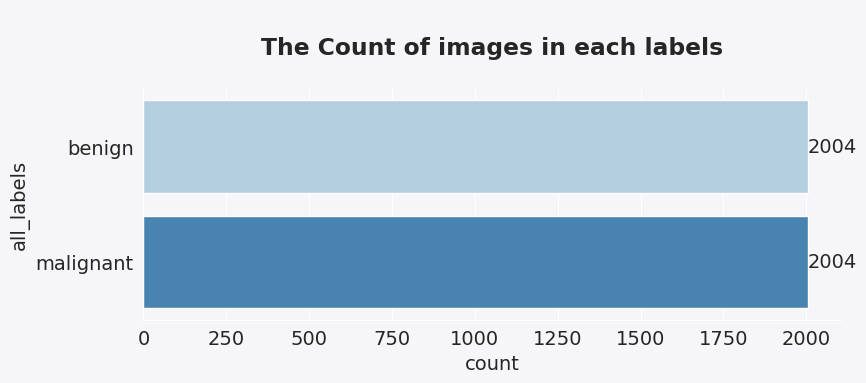

In [10]:
fig, ax=plt.subplots(figsize=(9,3))
fig.patch.set_facecolor("#f6f5f7")
ax.set_facecolor("#f6f5f7")

for i in ["top","right"]:
    ax.spines[i].set_visible(False)

x = sns.countplot(y=pd.Series(all_labels, name="all_labels"), palette='Blues')
for container in x.containers:
    x.bar_label(container)
    
plt.title("\nThe Count of images in each labels\n", weight="bold")

# Encode datasets

In [11]:
images = all_images
labels = all_labels
classes = list(data_dict.keys())
num_classes = len(classes)
classes

['benign', 'malignant']

In [12]:
# Convert labels to numpy array
x = np.stack(images, axis=0)
# x = np.stack(images, axis=0) / 255 # Normalize pixel
y = np.array([classes.index(label) for label in labels])

x.shape, y.shape

((4008, 224, 224, 3), (4008,))

# Split datasets

In [13]:
# Split the data into training and remaining sets (validation + test)
x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)
# Split the remaining data into validation and test sets
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

[
    x_train.shape, 
    x_val.shape, 
    x_test.shape, 
    y_train.shape , 
    y_val.shape , 
    y_test.shape
]

[(3206, 224, 224, 3),
 (401, 224, 224, 3),
 (401, 224, 224, 3),
 (3206,),
 (401,),
 (401,)]

Text(0.5, 1.0, '\nThe Count of images in each labels - Train\n')

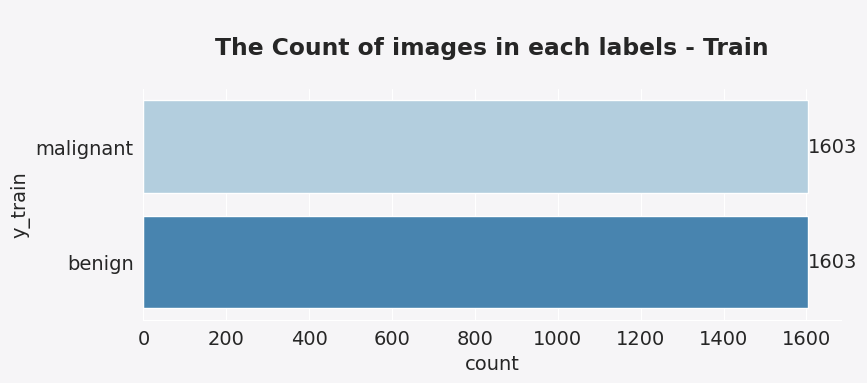

In [14]:
fig, ax=plt.subplots(figsize=(9,3))
fig.patch.set_facecolor("#f6f5f7")
ax.set_facecolor("#f6f5f7")

for i in ["top","right"]:
    ax.spines[i].set_visible(False)

x = sns.countplot(y=pd.Series(map(lambda i: classes[i], y_train), name="y_train"), palette='Blues')
for container in x.containers:
    x.bar_label(container)
    
plt.title("\nThe Count of images in each labels - Train\n", weight="bold")

Text(0.5, 1.0, '\nThe Count of images in each labels - Valid and Test\n')

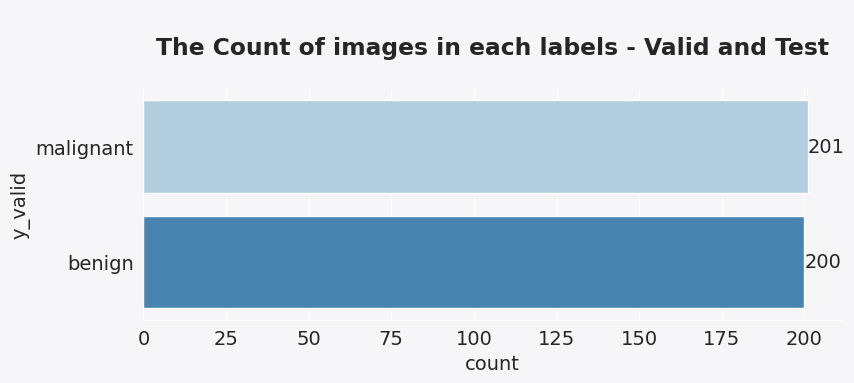

In [15]:
fig, ax=plt.subplots(figsize=(9,3))
fig.patch.set_facecolor("#f6f5f7")
ax.set_facecolor("#f6f5f7")

for i in ["top","right"]:
    ax.spines[i].set_visible(False)

x = sns.countplot(y=pd.Series(map(lambda i: classes[i], y_val), name="y_valid"), palette='Blues')
for container in x.containers:
    x.bar_label(container)
    
plt.title("\nThe Count of images in each labels - Valid and Test\n", weight="bold")

# Helper functions

In [16]:
def plot_acc(model_history, name):
    plt.rcParams.update({'font.size': 14})
    print('\n\n')
    epochs = len(model_history.history["accuracy"])
    plt.figure(figsize=(12,8))
    plt.plot(np.arange(0, epochs), model_history.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs), model_history.history["val_accuracy"], label="val_acc")
    plt.title("Training Accuracy - {}".format(name))
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

In [17]:
def plot_loss(model_history, name):
    plt.rcParams.update({'font.size': 14})
    print('\n\n')
    epochs = len(model_history.history["loss"])
    plt.figure(figsize=(12,8))
    plt.plot(np.arange(0, epochs), model_history.history["loss"], label="train_loss", )
    plt.plot(np.arange(0, epochs), model_history.history["val_loss"], label="val_loss")
    plt.title("Training Loss - {}".format(name))
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [18]:
# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.rcParams.update({'font.size': 14})
    
    # plot the confusion matrix
    class_count = len(classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
    plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
    plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.show()

In [19]:
def evaluate(model, x, y):
    scores = model.evaluate(x, y, verbose=1)
    return scores

In [20]:
def predict_prob(model):
    return model.predict(x_test, batch_size=BATCH_SIZE, verbose=1)

In [21]:
def predict(model):
    predictions = predict_prob(model)
    return np.argmax(predictions, axis=1)

In [22]:
def calculate_metrics(y_true, y_pred):
    
    print("Visualize: y_true, y_pred top 20")
    print('Y_true', [i for i in y_true[:20]])
    print('Y_pred', [j for j in y_pred[:20]])

    # precision tp / (tp + fp)
    precision = precision_score(y_true, y_pred, average='weighted')
    print("Precision: {}".format(precision))

    # recall: tp / (tp + fn)
    recall = recall_score(y_true, y_pred, average='weighted')
    print("Recall:    {}".format(recall))

    # f1: 2 tp / (2 tp + fp + fn)
    f1 = f1_score(y_true, y_pred, average='weighted')
    print("F1:        {}".format(f1))

# Setup Transfer Learning

In [23]:
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
)

In [24]:
def transfer_learning(model, name):
    
    best_weights_ph1 = f"{dataset_name}_{name}_ph1_weights.keras"
    
    callbacks_checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath = best_weights_ph1,
        monitor = "val_accuracy",
        mode = "max",
        save_weights_only=True,
        save_best_only = True,
        verbose=1, # Logging when callback running
    )
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(
        x_train,
        y_train,
        batch_size=BATCH_SIZE,
        validation_data=(x_val, y_val),
        validation_batch_size=BATCH_SIZE,
        epochs = EPOCHS,
        callbacks = [callbacks_checkpoint, early_stop]
    )
    
    acc_max = max(history.history["accuracy"])
    acc_min = min(history.history["accuracy"])
    print("Training Acc:", [acc_min, acc_max])
    
    val_acc_max = max(history.history["val_accuracy"])
    val_acc_min = min(history.history["val_accuracy"])
    print("Validation Acc:", [val_acc_min, val_acc_max])
    
    best_idx = np.argmax(history.history["val_accuracy"])
    print('The best val_acc result expected at epoch {} with metrics: '.format(best_idx + 1))
    
    for k, vals in history.history.items():
        print('{}: {}'.format(k, vals[best_idx]))
    
    print('\nRestoring best weights and predicting validation set.')
    model.load_weights(best_weights_ph1)
    model.save(f"{dataset_name}_{name}_ph1_model.keras")
    
    loss, acc = evaluate(model, x_test, y_test)
    print('Transfer Learning test scores (loss, acc):', [loss, acc])
    plot_acc(history, f"\n Transfer Learning - ACC: {name} PhA.")
    plot_loss(history, f"\n Transfer Learning - LOSS: {name} PhA.")
    y_pred = predict(model)
    return history, model, val_acc_max, y_pred

# Setup fine tuning

In [25]:
def fine_turning(model, name, acc_ph1):
    
    best_weights_ph2 = f"{dataset_name}_{name}_ph2_weights.keras"
    callbacks_checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath = best_weights_ph2,
        monitor = "val_accuracy",
        mode = "max",
        save_weights_only=True,
        save_best_only = True,
        verbose=1, # Logging when callback running
    )
    
    for layer in model.layers:
        if isinstance(layer, layers.BatchNormalization) or isinstance(layer, layers.LayerNormalization):
            layer.trainable = False
        else:
            layer.trainable = True

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(
        x_train, 
        y_train,
        batch_size=BATCH_SIZE,
        validation_data=(x_val, y_val),
        validation_batch_size=BATCH_SIZE,
        epochs = EPOCHS,
        callbacks = [callbacks_checkpoint, early_stop]
    )
    
    acc_max = max(history.history["accuracy"])
    acc_min = min(history.history["accuracy"])
    print("Training Acc:", [acc_min, acc_max])
    
    val_acc_max = max(history.history["val_accuracy"])
    val_acc_min = min(history.history["val_accuracy"])
    print("Validation Acc:", [val_acc_min, val_acc_max])
    
    best_idx = np.argmax(history.history["val_accuracy"])
    print('The best val_acc result expected at epoch {} with metrics: '.format(best_idx))
    for k, vals in history.history.items():
        print('{}: {}'.format(k, vals[best_idx]))
    
    print('Restoring best weights of Ph2 and predicting test set.')
    model.load_weights(best_weights_ph2)
    model.save(f"{dataset_name}_{name}_ph2_model.keras")
    
    loss, acc = evaluate(model, x_test, y_test)
    print('Fine Tuning test scores (loss, acc):', [loss, acc])
    
    if val_acc_max < acc_ph1:
        print('\nPhase 2 resulted in lower accuracy than Phase 1.')
    
    plot_acc(history, f"\n Fine Tuning - ACC: {name} PhB.")
    plot_loss(history, f"\n Fine Tuning - LOSS: {name} PhB.")
    
    y_pred = predict(model)
    return history, model, val_acc_max, y_pred

# Build Model

In [26]:
initial_models = dict(
#     EfficientNetV2B3=tf.keras.applications.efficientnet_v2.EfficientNetV2B3,
    ResNet50V2=tf.keras.applications.resnet_v2.ResNet50V2,
    MobileNetV2=tf.keras.applications.mobilenet_v2.MobileNetV2,
#     EfficientNetB3=tf.keras.applications.EfficientNetB3,
#     ResNet50=tf.keras.applications.resnet50.ResNet50,
    MobileNet=tf.keras.applications.mobilenet.MobileNet,
)

base_model_kwargs = dict(
    include_top=False,
    weights='imagenet',
    input_shape=INPUT_SHAPE,
    pooling='max'
)

# custom kwargs for each model here 
initial_models_kwargs = dict(
    EfficientNetV2B3={ **base_model_kwargs },
    ResNet50V2={ **base_model_kwargs },
    MobileNetV2={ **base_model_kwargs },
    EfficientNetB3={ **base_model_kwargs },
    ResNet50={ **base_model_kwargs },
    MobileNet={ **base_model_kwargs },
    Xception={ **base_model_kwargs }
)

# Explanation setup

In [27]:
# Adapted with some modification from https://www.pyimagesearch.com/2020/03/09/grad-cam-visualize-class-activation-maps-with-keras-tensorflow-and-deep-learning/
class GradCAM:
    
    def __init__(self, model, layerName=None):
        self.model = model
        self.layerName = layerName
            
        if self.layerName == None:
            self.layerName = self.find_target_layer()
    
    def find_target_layer(self):
        for layer in reversed(self.model.layers):
            if len(layer.output_shape) == 4:
                return layer.name
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM")
            
    def compute_heatmap(self, image, classIdx, upsample_size, eps=1e-5):
        
        gradModel = tf.keras.Model(
            inputs = [self.model.inputs],
            outputs = [self.model.get_layer(self.layerName).output, self.model.output],
            name='gradcam'
        )
        
        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            inputs = tf.cast(image, tf.float32)
            (convOuts, preds) = gradModel(inputs)
            loss = preds[:, classIdx]
        
        # compute gradients with automatic differentiation
        grads = tape.gradient(loss, convOuts)
        
        # discard batch
        convOuts = convOuts[0]
        grads = grads[0]
        norm_grads = tf.divide(grads, tf.reduce_mean(tf.square(grads)) + tf.constant(eps))
        
        # compute weights
        weights = tf.reduce_mean(norm_grads, axis=(0,1))
        cam = tf.reduce_sum(tf.multiply(weights, convOuts), axis=-1)
        
        # Apply reLU
        cam = np.maximum(cam, 0)
        cam = cam / np.max(cam)
        cam = cv2.resize(cam, upsample_size)
        
        # convert to 3D
        cam3 = np.expand_dims(cam, axis=2)
        cam3 = np.tile(cam3, [1,1,3])
        
        return cam3


def overlay_gradCAM(img, cam3):
    cam3 = np.uint8(255 * cam3)
    cam3 = cv2.applyColorMap(cam3, cv2.COLORMAP_JET)
    new_img = 0.5 * cam3 + 0.5 * img
    return (new_img * 255.0 / new_img.max()).astype("uint8")

def show_gradCAMs(model, gradCAM, batch, true_label, decode_labels={}):
    
    plt.rcParams.update({'font.size': 13})
    n = len(batch)
    ncols = int(np.round(n / 2, 0))
    plt.figure(figsize=(20, ncols * 5))
    preds = model.predict(batch)
    
    for i in range(n):
        
        # Show original image
        plt.subplot(ncols, 4, 2 * i + 1)
        plt.imshow(batch[i])
        plt.title("Ground Truth: {}".format(true_label))
        plt.axis("off")
        
        # Show overlayed grad
        plt.subplot(ncols, 4, 2 * i + 2)
        pred = preds[i]
        idx = np.argmax(preds, axis=1)[i]
        res = [decode_labels[idx], float(np.max(pred))]
        
        heat_map = gradCAM.compute_heatmap(image=np.expand_dims(batch[i], axis=0), classIdx=idx, upsample_size=(IMG_SIZE, IMG_SIZE))
        overlay_img = overlay_gradCAM(batch[i], heat_map)
        plt.imshow(overlay_img)
        plt.title("Predict: {}\nConfidence: {:.4f}".format(res[0], float(res[1])))
        plt.axis("off")
        
    plt.show()

In [28]:
def visualize_gradcam(model, title):
    print(title)
    gradCAM = GradCAM(model=model)
    for label, batch in data_dict.items():
        print(f'Label: {label}.')
        
        batch = np.stack(batch, axis=0)[:2]
        show_gradCAMs(model, gradCAM, batch, label, decode_labels=classes)

# Setup save history

In [29]:
def save_history(history, path):
    history_df = pd.DataFrame(data=history)
    history_df.index.name = "Epoch"
    history_df.to_csv(path)
    print("Saved history completed.")
    print(history_df)

# Train

94668760/94668760 [==============================] - 0s 0us/step


 ==========Start Process with model ResNet50V2=========
Model: "ResNet50V2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0      

I0000 00:00:1710954051.465776      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


201/201 [==============================] - ETA: 0s - loss: 0.6432 - accuracy: 0.7143
Epoch 1: val_accuracy improved from -inf to 0.72070, saving model to skin-cancer_ResNet50V2_ph1_weights.keras
201/201 [==============================] - 22s 60ms/step - loss: 0.6432 - accuracy: 0.7143 - val_loss: 0.5852 - val_accuracy: 0.7207
Epoch 2/100
201/201 [==============================] - ETA: 0s - loss: 0.4750 - accuracy: 0.7820
Epoch 2: val_accuracy improved from 0.72070 to 0.83292, saving model to skin-cancer_ResNet50V2_ph1_weights.keras
201/201 [==============================] - 8s 42ms/step - loss: 0.4750 - accuracy: 0.7820 - val_loss: 0.4053 - val_accuracy: 0.8329
Epoch 3/100
201/201 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8337
Epoch 3: val_accuracy improved from 0.83292 to 0.83791, saving model to skin-cancer_ResNet50V2_ph1_weights.keras
201/201 [==============================] - 8s 42ms/step - loss: 0.3919 - accuracy: 0.8337 - val_loss: 0.4010 - val_accur

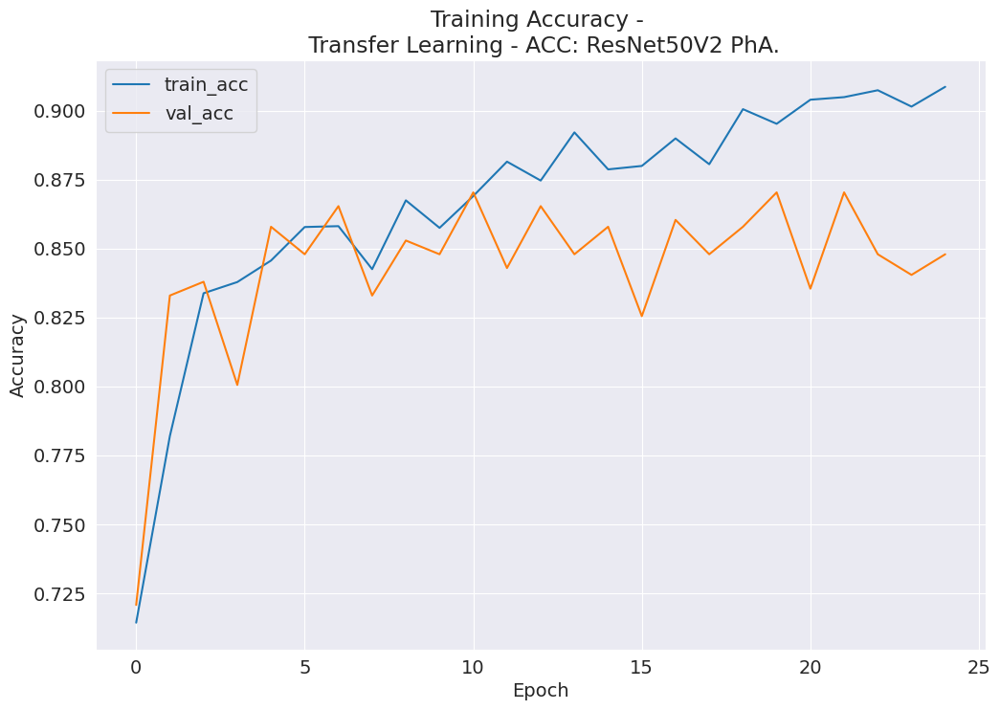

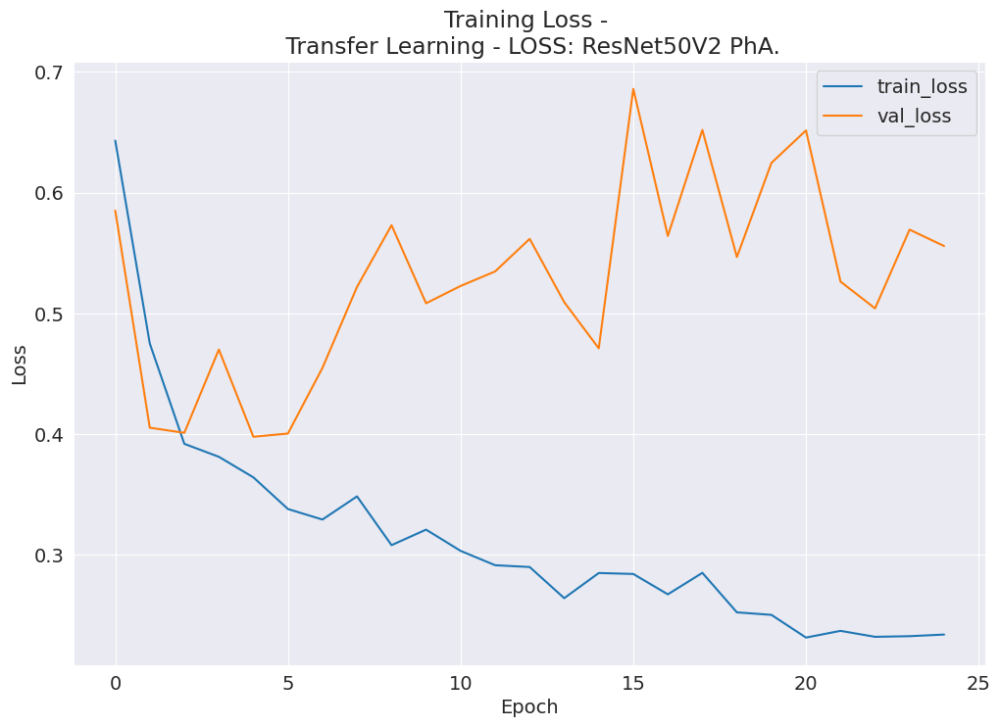

26/26 [==============================] - 2s 29ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
Precision: 0.8832703092112837
Recall:    0.8827930174563591
F1:        0.8827623970273675


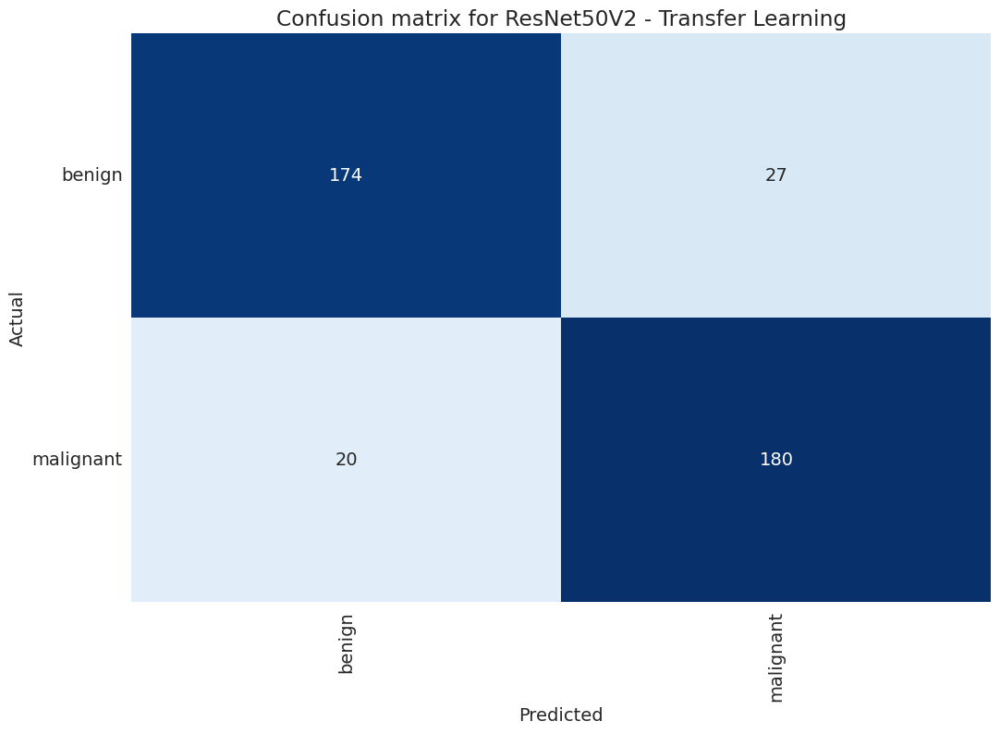

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.643151  0.714286  0.585186      0.720698
1      0.475026  0.781971  0.405256      0.832918
2      0.391890  0.833749  0.401021      0.837905
3      0.381138  0.837804  0.470026      0.800499
4      0.364108  0.845602  0.397735      0.857855
5      0.337873  0.857767  0.400438      0.847880
6      0.329158  0.858079  0.454827      0.865337
7      0.348335  0.842483  0.521857      0.832918
8      0.307934  0.867436  0.573020      0.852868
9      0.320806  0.857455  0.508335      0.847880
10     0.303193  0.868996  0.522701      0.870324
11     0.291305  0.881472  0.534723      0.842893
12     0.289825  0.874610  0.561684      0.865337
13     0.264017  0.892077  0.509284      0.847880
14     0.284857  0.878665  0.471004      0.857855
15     0.284067  0.879913  0.685968      0.825436
16     0.267179  0.889894  0.564123      0.860349
17     0.285003  0.880536

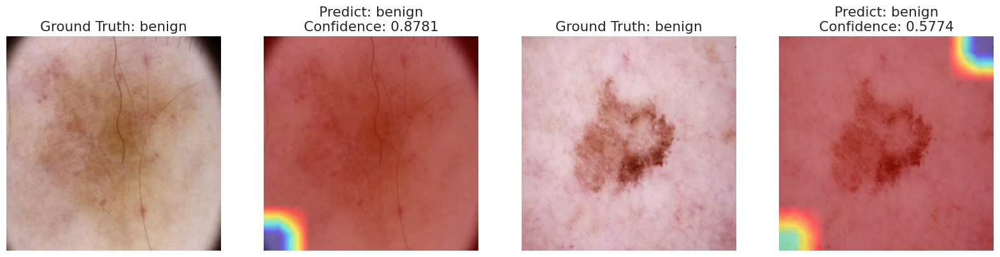

Label: malignant.
1/1 [==============================] - 0s 25ms/step


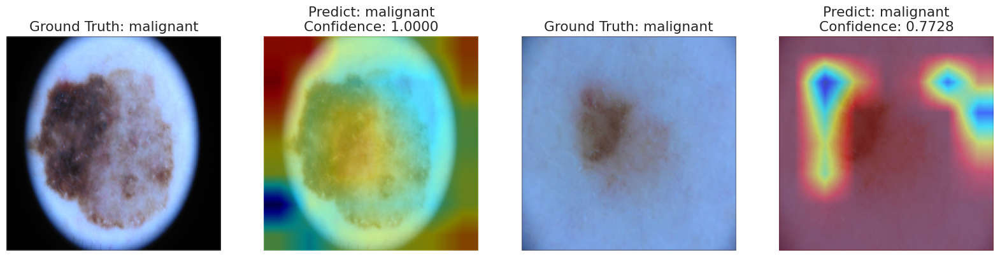

Epoch 1/100
201/201 [==============================] - ETA: 0s - loss: 0.7716 - accuracy: 0.6921
Epoch 1: val_accuracy improved from -inf to 0.63342, saving model to skin-cancer_ResNet50V2_ph2_weights.keras
201/201 [==============================] - 41s 120ms/step - loss: 0.7716 - accuracy: 0.6921 - val_loss: 0.6738 - val_accuracy: 0.6334
Epoch 2/100
201/201 [==============================] - ETA: 0s - loss: 0.4637 - accuracy: 0.7854
Epoch 2: val_accuracy improved from 0.63342 to 0.86783, saving model to skin-cancer_ResNet50V2_ph2_weights.keras
201/201 [==============================] - 21s 106ms/step - loss: 0.4637 - accuracy: 0.7854 - val_loss: 0.3777 - val_accuracy: 0.8678
Epoch 3/100
201/201 [==============================] - ETA: 0s - loss: 0.5361 - accuracy: 0.7714
Epoch 3: val_accuracy did not improve from 0.86783
201/201 [==============================] - 21s 103ms/step - loss: 0.5361 - accuracy: 0.7714 - val_loss: 0.4896 - val_accuracy: 0.8204
Epoch 4/100
201/201 [============

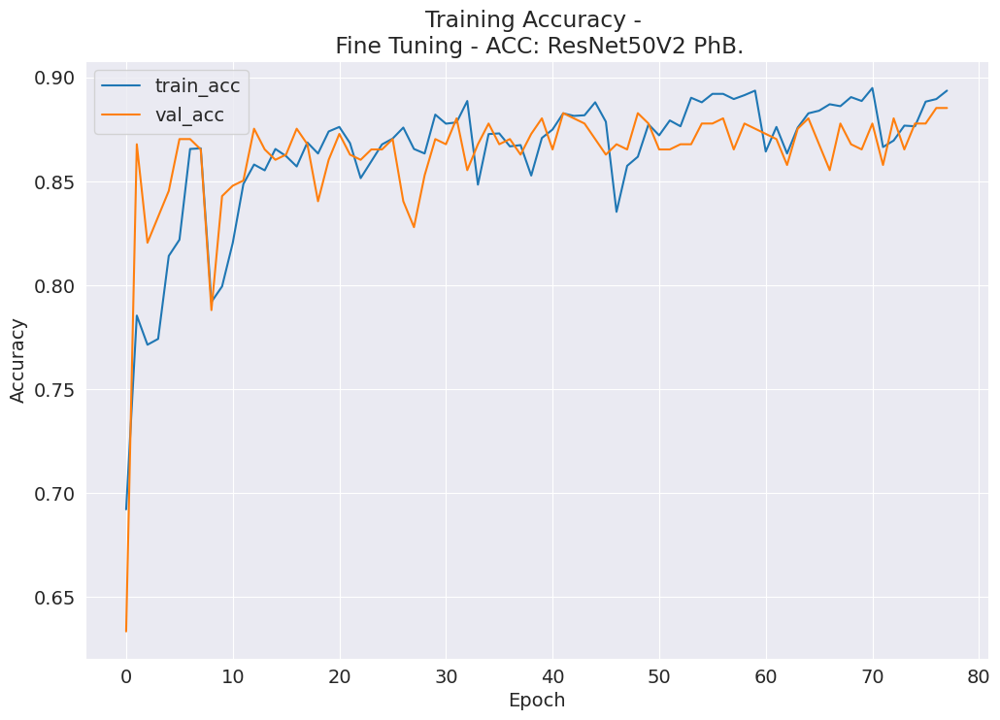

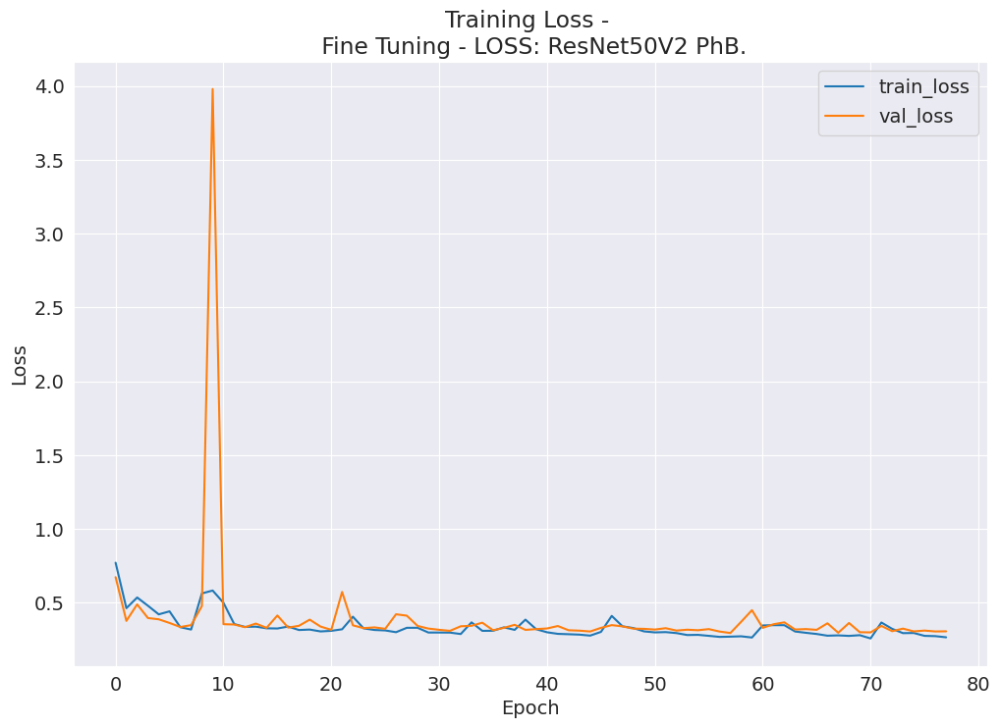

26/26 [==============================] - 2s 30ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
Precision: 0.9152511813961637
Recall:    0.9152119700748129
F1:        0.9152088061849457


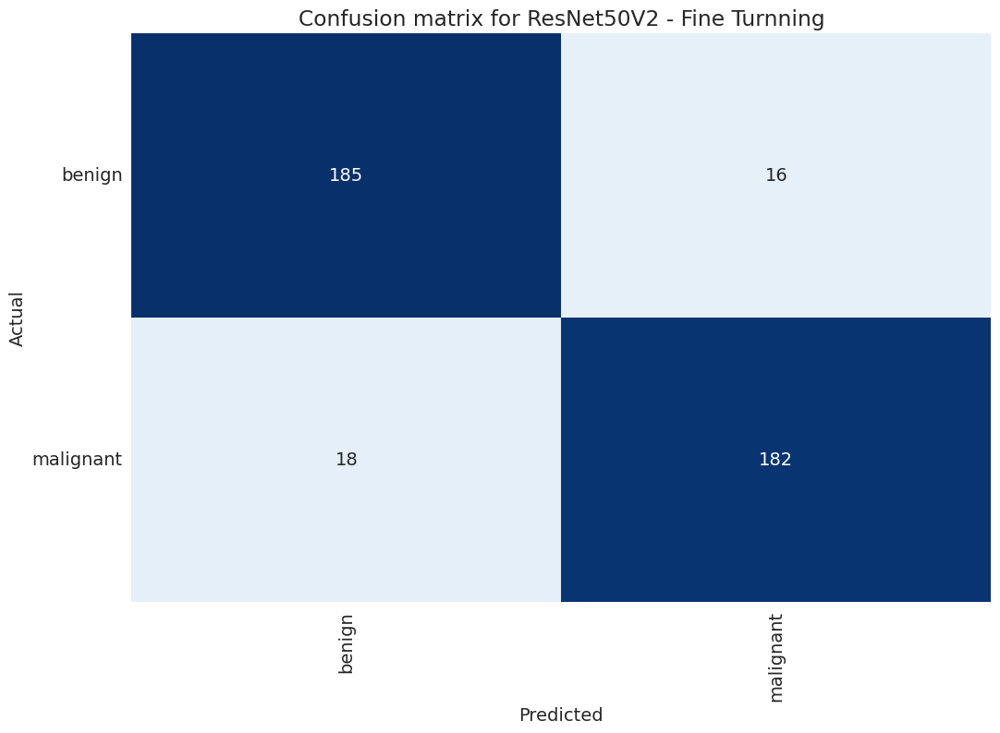

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.771645  0.692140  0.673831      0.633416
1      0.463747  0.785402  0.377718      0.867830
2      0.536100  0.771366  0.489634      0.820449
3      0.480237  0.774173  0.396956      0.832918
4      0.421924  0.814099  0.388372      0.845387
...         ...       ...       ...           ...
73     0.294748  0.876794  0.325305      0.865337
74     0.295775  0.876482  0.306546      0.877805
75     0.276347  0.888334  0.312098      0.877805
76     0.274444  0.889582  0.306111      0.885287
77     0.266528  0.893637  0.307053      0.885287

[78 rows x 4 columns]
==========GRADCAM after fine tuning==========
Label: benign.
1/1 [==============================] - 1s 976ms/step


/tmp/ipykernel_27/3772978291.py:45: RuntimeWarning: invalid value encountered in divide
  cam = cam / np.max(cam)
/tmp/ipykernel_27/3772978291.py:56: RuntimeWarning: invalid value encountered in cast
  cam3 = np.uint8(255 * cam3)


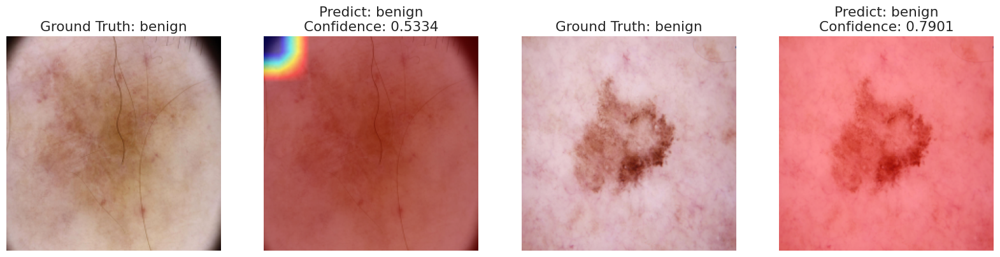

Label: malignant.
1/1 [==============================] - 0s 24ms/step


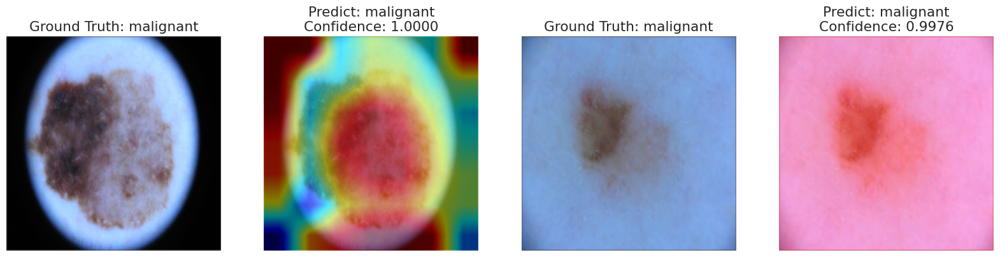

==========End Process with model ResNet50V2==========


9406464/9406464 [==============================] - 0s 0us/step


 ==========Start Process with model MobileNetV2=========
Model: "MobileNetV2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
         

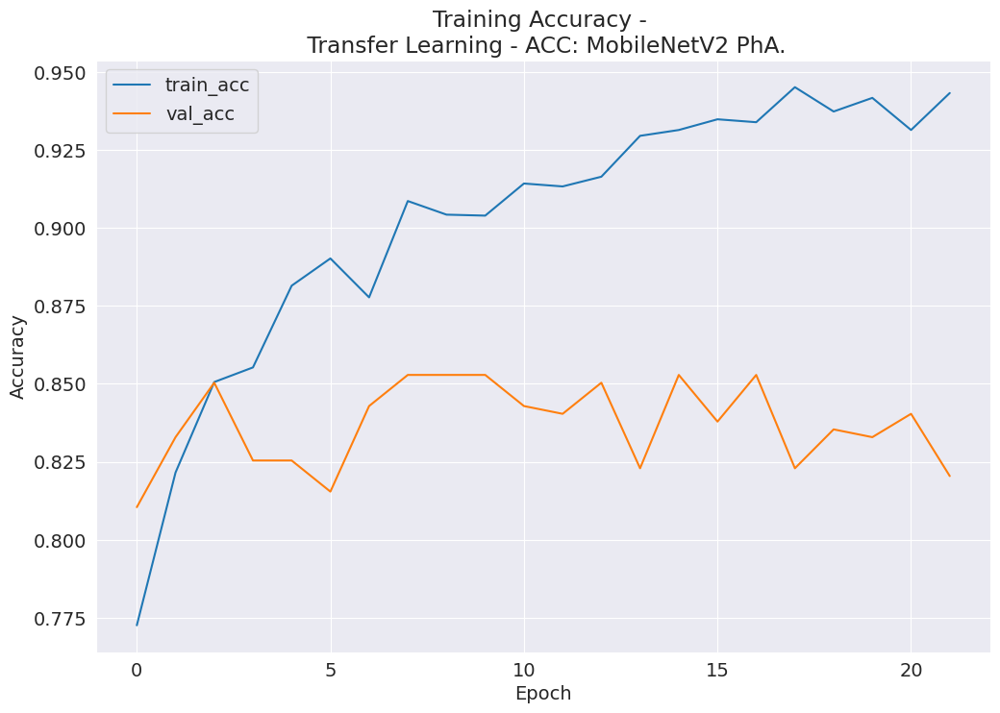

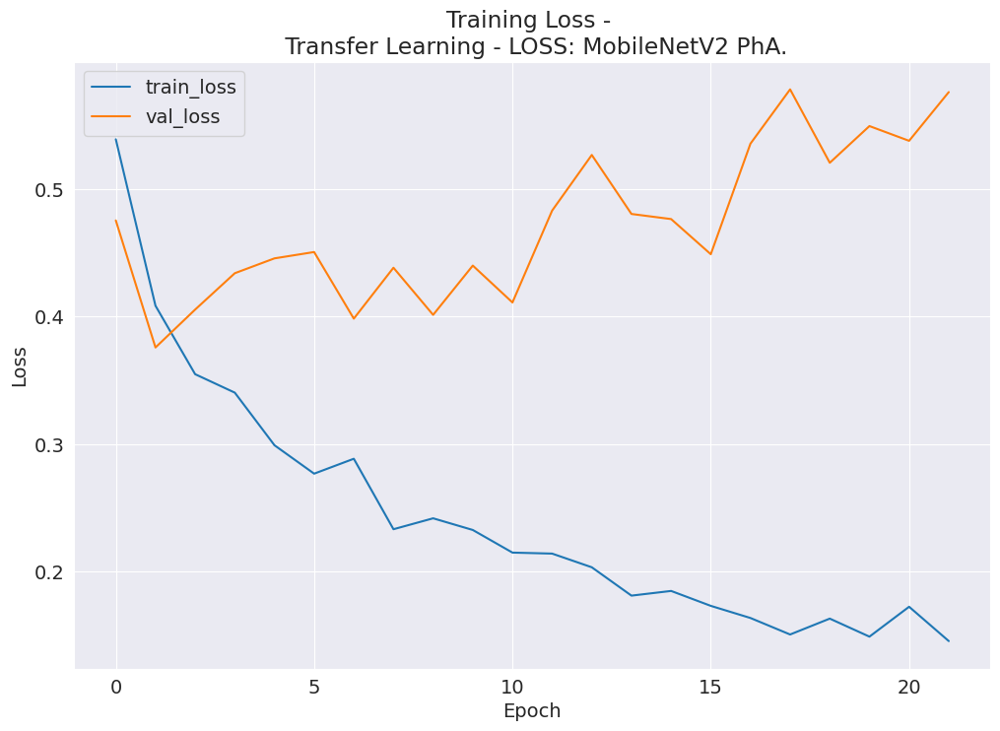

26/26 [==============================] - 1s 16ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]
Precision: 0.8554005552812828
Recall:    0.8553615960099751
F1:        0.8553597970248508


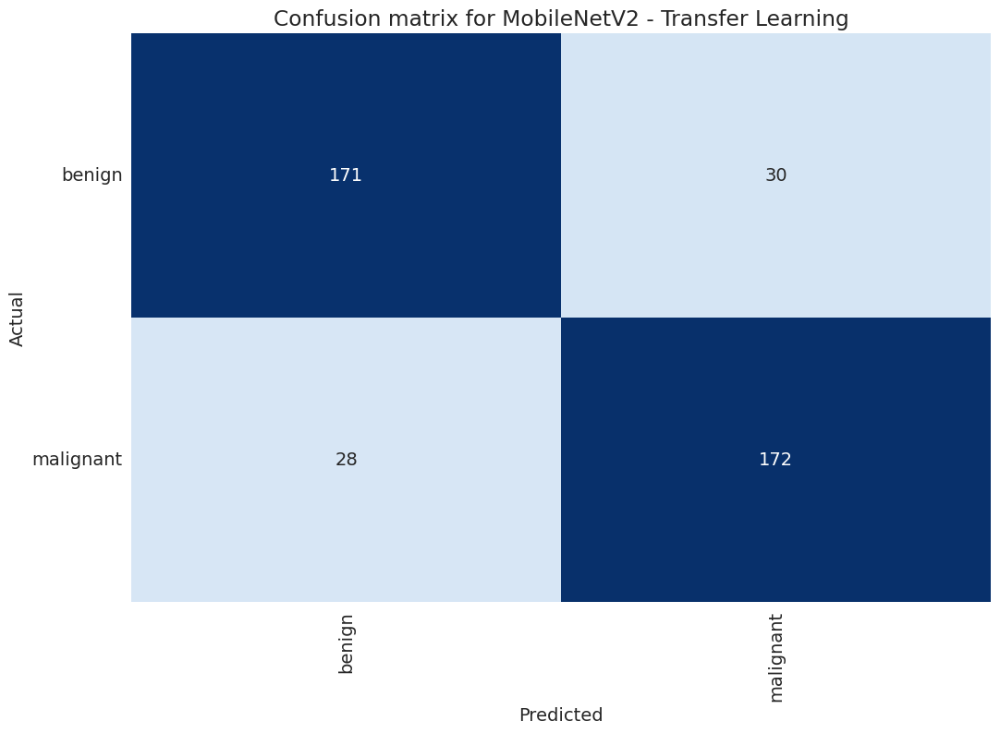

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.539180  0.772614  0.475525      0.810474
1      0.408616  0.821585  0.375874      0.832918
2      0.354913  0.850593  0.405601      0.850374
3      0.340438  0.855271  0.434129      0.825436
4      0.299186  0.881472  0.445774      0.825436
5      0.276895  0.890206  0.450736      0.815461
6      0.288586  0.877729  0.398498      0.842893
7      0.233313  0.908609  0.438427      0.852868
8      0.241875  0.904242  0.401457      0.852868
9      0.232718  0.903930  0.440113      0.852868
10     0.214973  0.914223  0.411186      0.842893
11     0.214193  0.913288  0.483228      0.840399
12     0.203460  0.916407  0.526886      0.850374
13     0.181227  0.929507  0.480603      0.822943
14     0.184898  0.931379  0.476596      0.852868
15     0.173204  0.934810  0.449028      0.837905
16     0.163681  0.933874  0.535741      0.852868
17     0.150733  0.945103

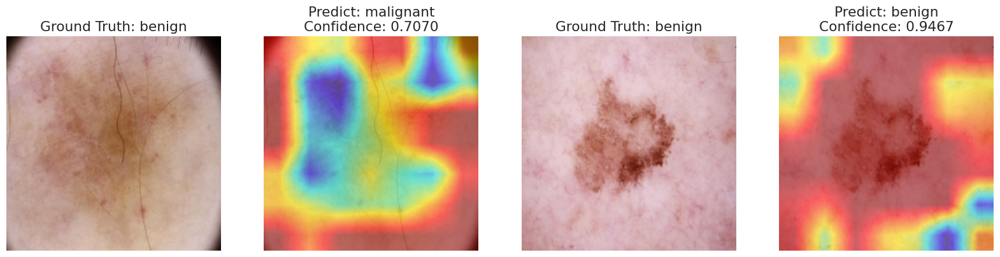

Label: malignant.
1/1 [==============================] - 0s 23ms/step


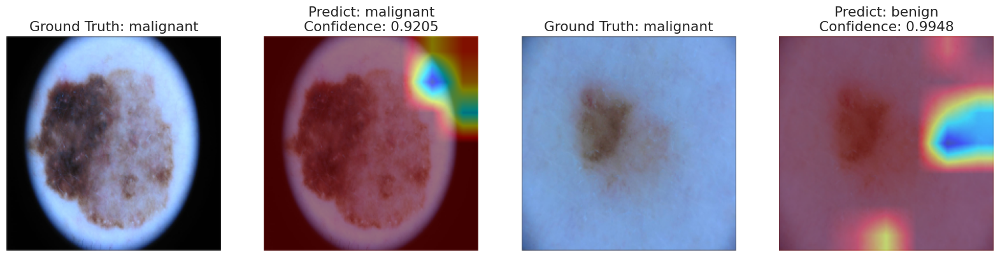

Epoch 1/100
201/201 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.8961
Epoch 1: val_accuracy improved from -inf to 0.82544, saving model to skin-cancer_MobileNetV2_ph2_weights.keras
201/201 [==============================] - 27s 73ms/step - loss: 0.2735 - accuracy: 0.8961 - val_loss: 0.4063 - val_accuracy: 0.8254
Epoch 2/100
200/201 [============================>.] - ETA: 0s - loss: 0.2580 - accuracy: 0.8944
Epoch 2: val_accuracy improved from 0.82544 to 0.85536, saving model to skin-cancer_MobileNetV2_ph2_weights.keras
201/201 [==============================] - 12s 62ms/step - loss: 0.2579 - accuracy: 0.8943 - val_loss: 0.4551 - val_accuracy: 0.8554
Epoch 3/100
200/201 [============================>.] - ETA: 0s - loss: 0.2235 - accuracy: 0.9078
Epoch 3: val_accuracy did not improve from 0.85536
201/201 [==============================] - 12s 60ms/step - loss: 0.2233 - accuracy: 0.9080 - val_loss: 0.4410 - val_accuracy: 0.8329
Epoch 4/100
200/201 [=============

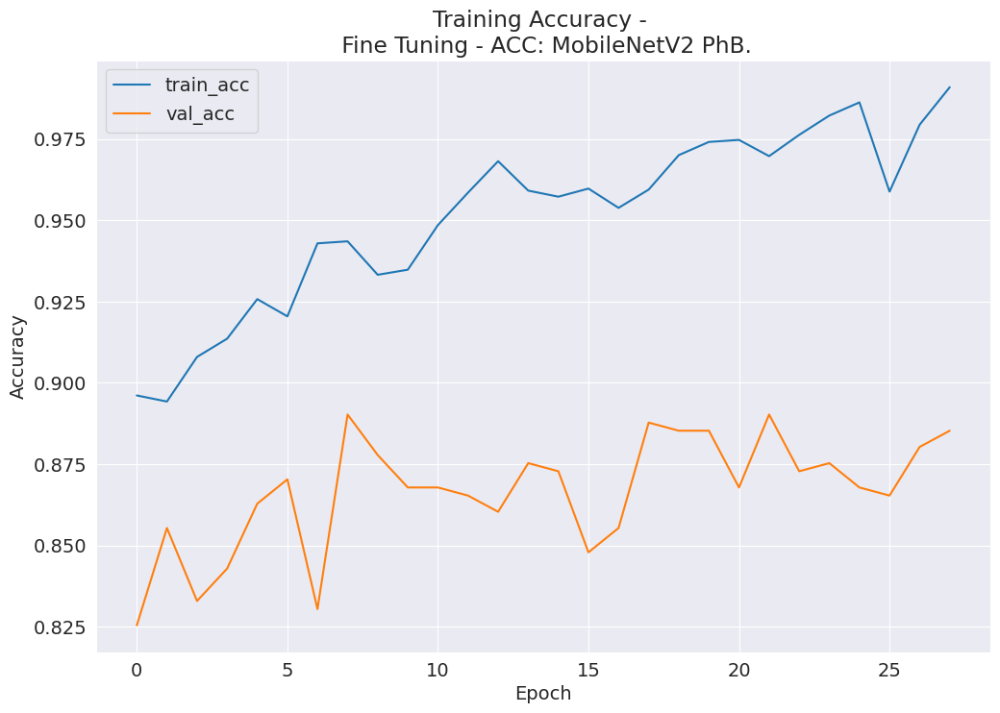

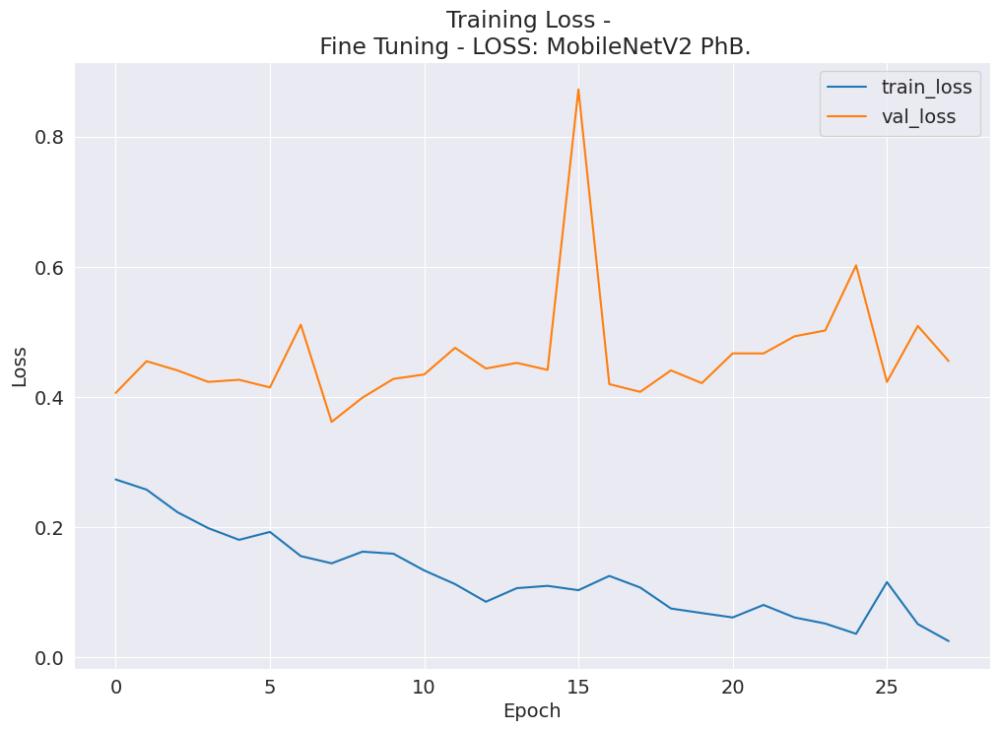

26/26 [==============================] - 2s 16ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]
Precision: 0.8877915906750536
Recall:    0.8877805486284289
F1:        0.887780548628429


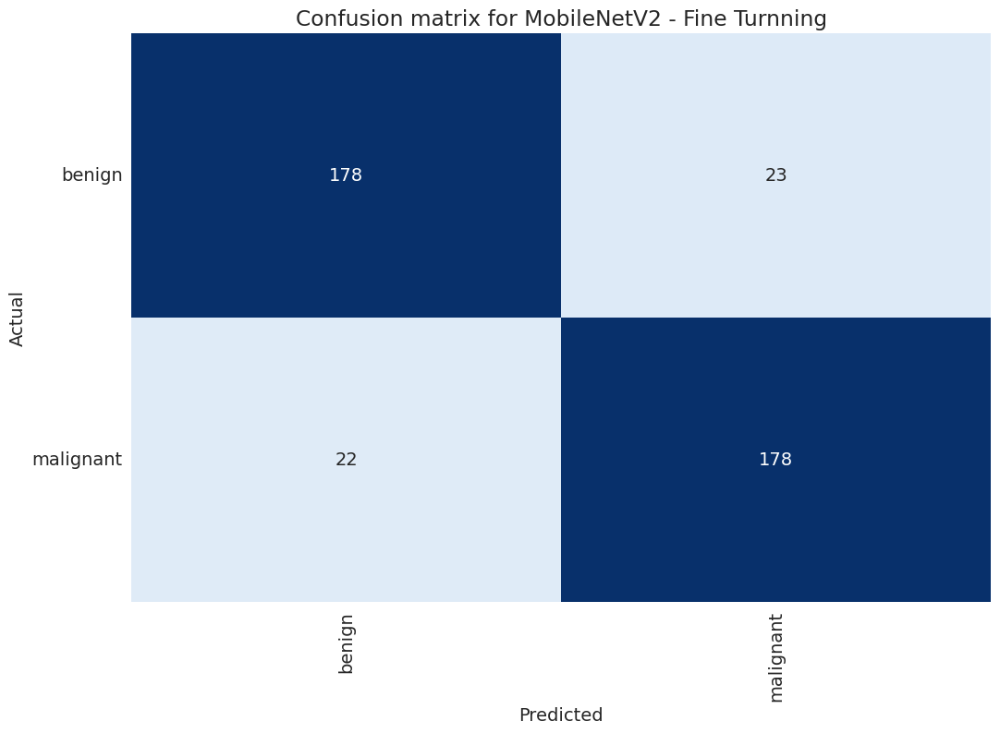

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.273478  0.896132  0.406323      0.825436
1      0.257922  0.894261  0.455076      0.855362
2      0.223267  0.907985  0.440989      0.832918
3      0.198746  0.913599  0.423287      0.842893
4      0.180765  0.925764  0.426599      0.862843
5      0.192930  0.920462  0.414806      0.870324
6      0.155810  0.942920  0.511166      0.830424
7      0.144706  0.943543  0.361888      0.890274
8      0.162607  0.933250  0.399175      0.877805
9      0.159478  0.934810  0.427869      0.867830
10     0.133786  0.948534  0.434715      0.867830
11     0.112811  0.958515  0.475647      0.865337
12     0.085702  0.968185  0.443888      0.860349
13     0.106577  0.959139  0.452492      0.875312
14     0.110105  0.957268  0.441769      0.872818
15     0.103483  0.959763  0.872497      0.847880
16     0.125366  0.953837  0.419908      0.855362
17     0.107614  0.959451

/tmp/ipykernel_27/3772978291.py:45: RuntimeWarning: invalid value encountered in divide
  cam = cam / np.max(cam)
/tmp/ipykernel_27/3772978291.py:56: RuntimeWarning: invalid value encountered in cast
  cam3 = np.uint8(255 * cam3)


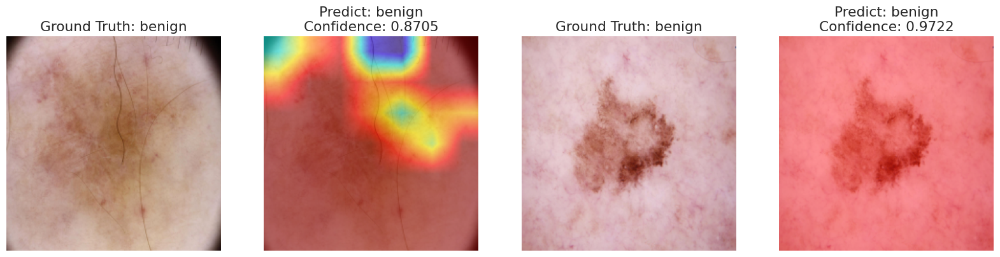

Label: malignant.
1/1 [==============================] - 0s 24ms/step


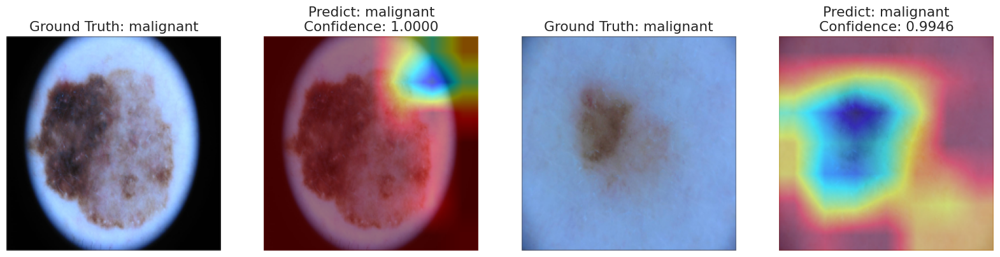

==========End Process with model MobileNetV2==========


17225924/17225924 [==============================] - 0s 0us/step


 ==========Start Process with model MobileNet=========
Model: "MobileNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )        

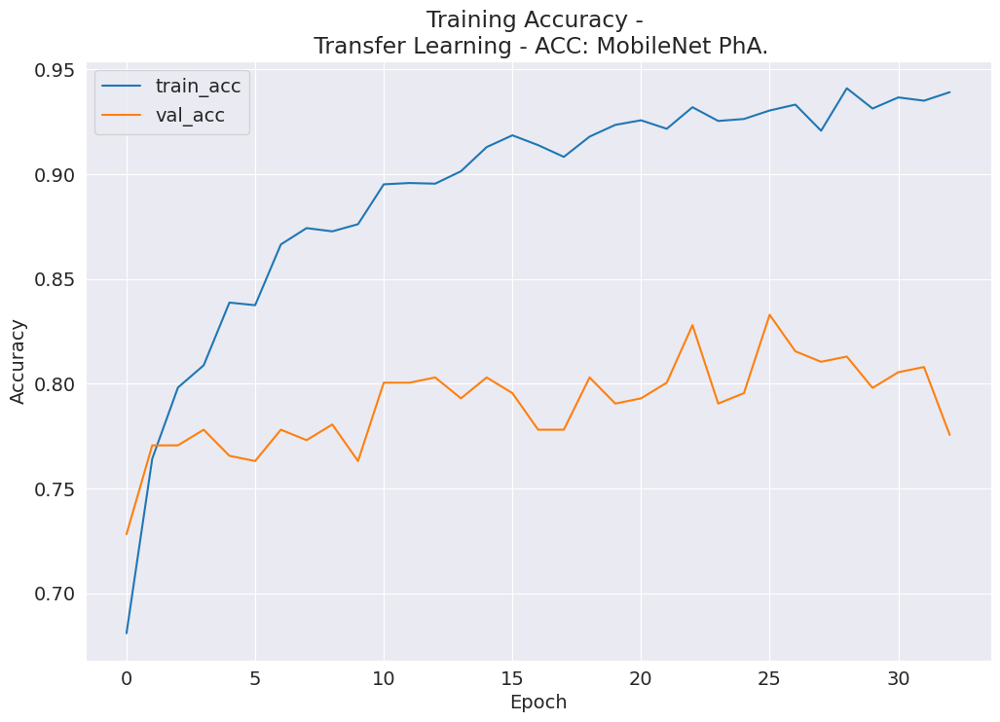

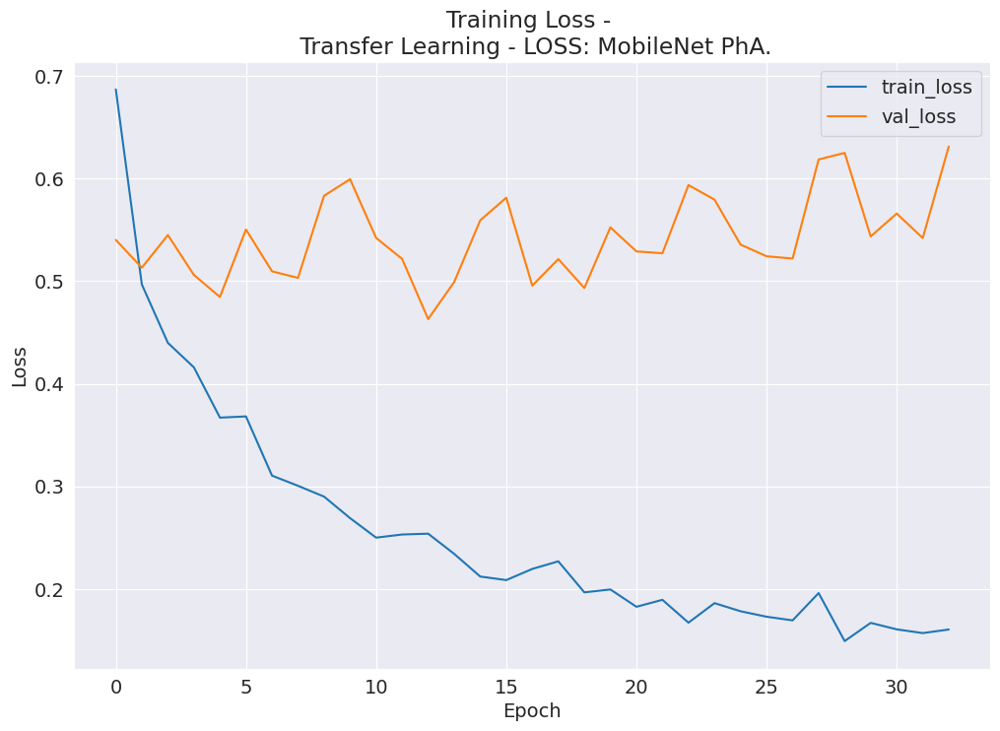

26/26 [==============================] - 1s 14ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
Precision: 0.8178542266331643
Recall:    0.8129675810473815
F1:        0.8122083549907432


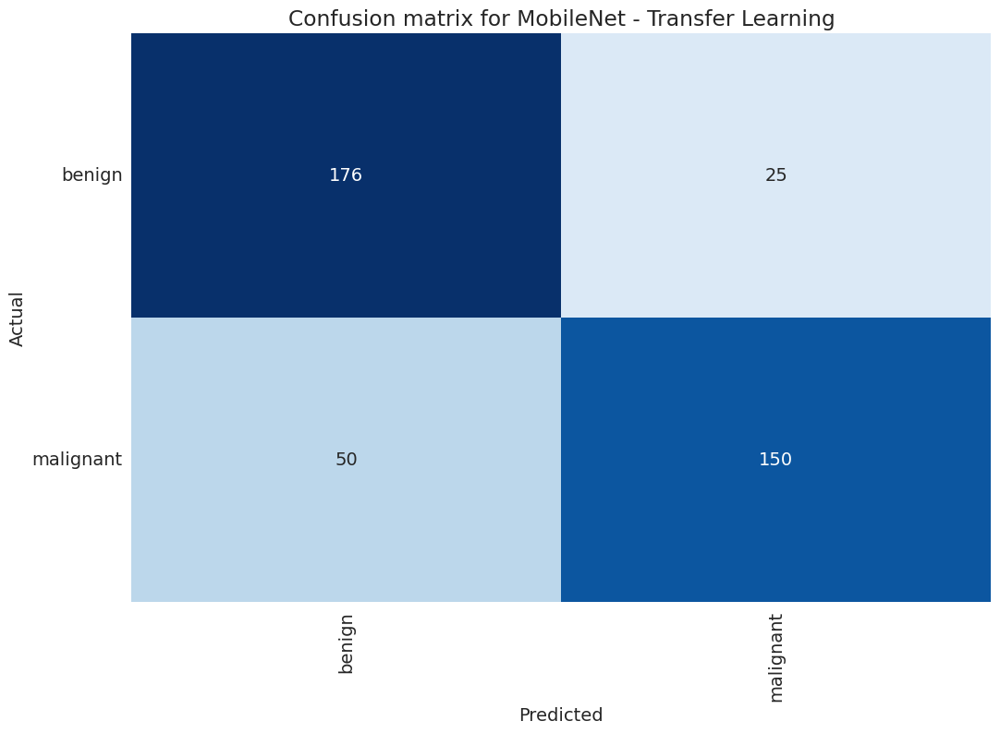

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.686737  0.680911  0.540091      0.728180
1      0.496720  0.764192  0.513049      0.770574
2      0.439819  0.798191  0.544817      0.770574
3      0.415942  0.808796  0.505982      0.778055
4      0.366976  0.838740  0.484498      0.765586
5      0.368171  0.837492  0.550222      0.763092
6      0.310522  0.866500  0.509500      0.778055
7      0.300558  0.874298  0.503112      0.773067
8      0.290050  0.872739  0.583084      0.780549
9      0.269075  0.876170  0.599216      0.763092
10     0.250075  0.895196  0.542050      0.800499
11     0.253134  0.895820  0.521553      0.800499
12     0.253926  0.895508  0.462944      0.802993
13     0.234244  0.901435  0.499133      0.793017
14     0.212187  0.912976  0.559168      0.802993
15     0.208712  0.918590  0.581225      0.795511
16     0.219594  0.913911  0.495546      0.778055
17     0.227001  0.908297

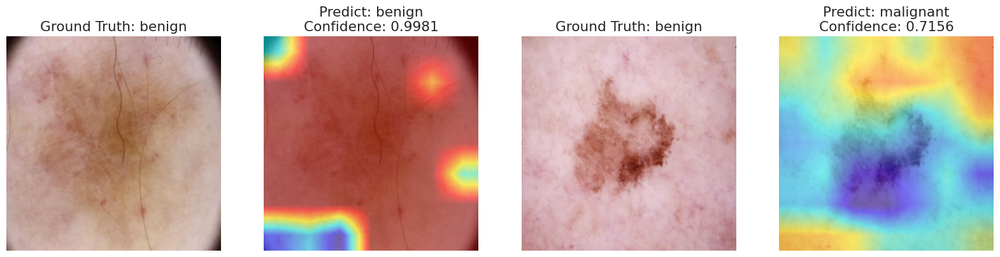

Label: malignant.
1/1 [==============================] - 0s 22ms/step


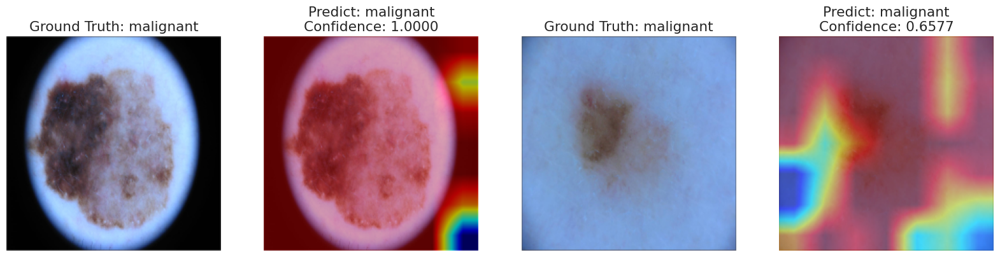

Epoch 1/100
201/201 [==============================] - ETA: 0s - loss: 0.3098 - accuracy: 0.8674
Epoch 1: val_accuracy improved from -inf to 0.75561, saving model to skin-cancer_MobileNet_ph2_weights.keras
201/201 [==============================] - 19s 59ms/step - loss: 0.3098 - accuracy: 0.8674 - val_loss: 0.6604 - val_accuracy: 0.7556
Epoch 2/100
200/201 [============================>.] - ETA: 0s - loss: 0.2953 - accuracy: 0.8819
Epoch 2: val_accuracy did not improve from 0.75561
201/201 [==============================] - 10s 50ms/step - loss: 0.2951 - accuracy: 0.8821 - val_loss: 0.4797 - val_accuracy: 0.7556
Epoch 3/100
200/201 [============================>.] - ETA: 0s - loss: 0.2905 - accuracy: 0.8816
Epoch 3: val_accuracy improved from 0.75561 to 0.79800, saving model to skin-cancer_MobileNet_ph2_weights.keras
201/201 [==============================] - 10s 51ms/step - loss: 0.2904 - accuracy: 0.8815 - val_loss: 0.4657 - val_accuracy: 0.7980
Epoch 4/100
200/201 [=================

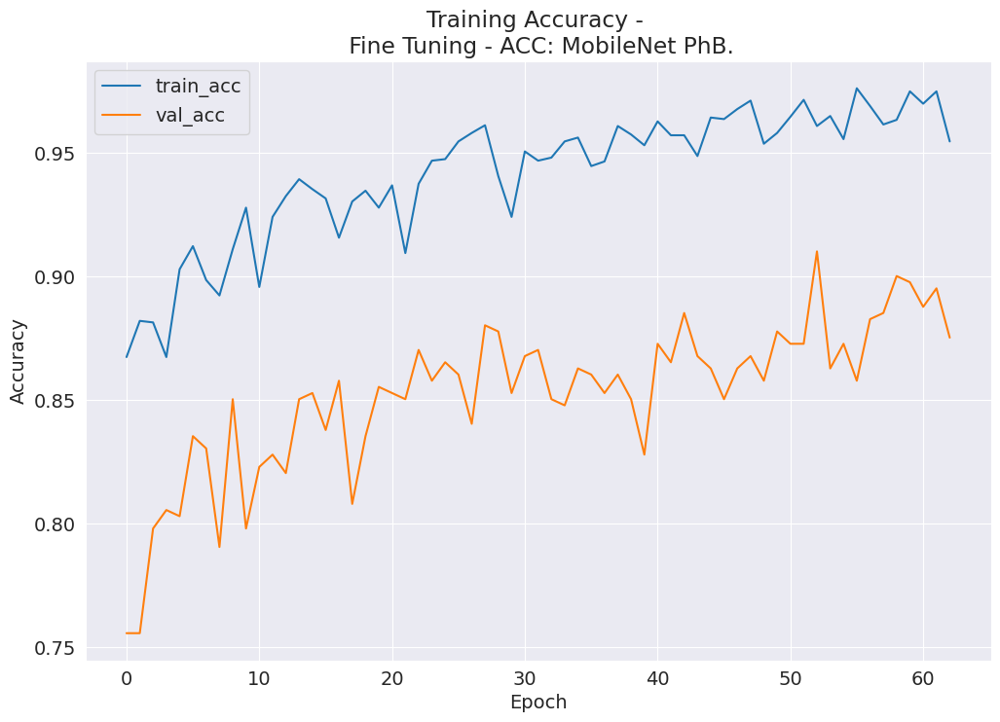

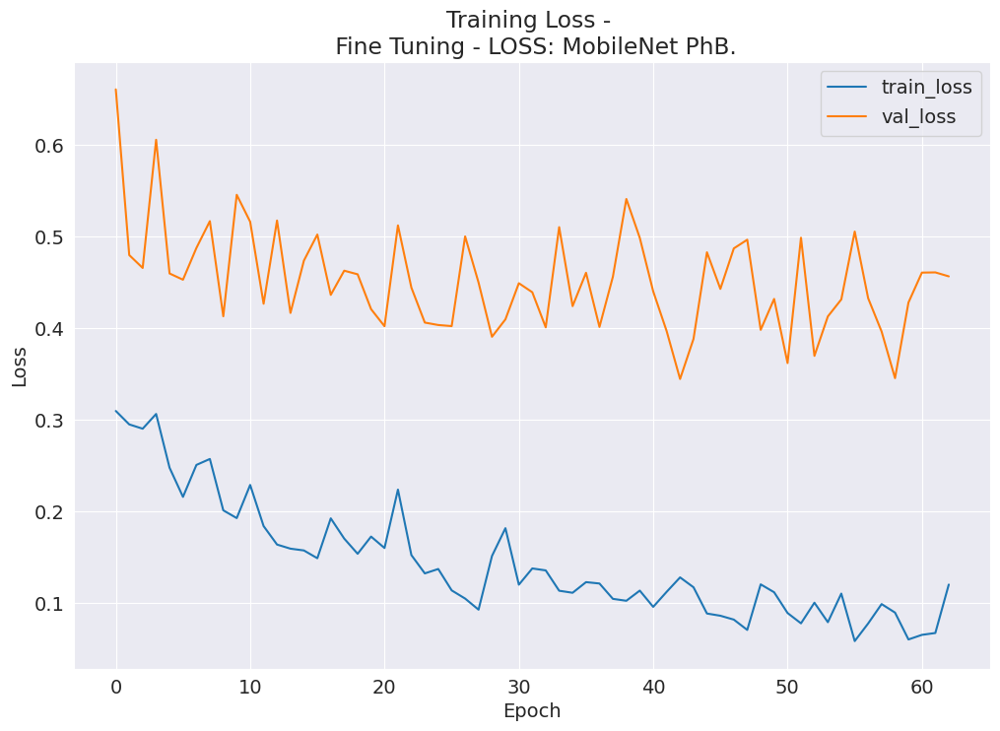

26/26 [==============================] - 1s 14ms/step
Visualize: y_true, y_pred top 20
Y_true [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]
Y_pred [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
Precision: 0.9217216019549808
Recall:    0.9201995012468828
F1:        0.9201339444517908


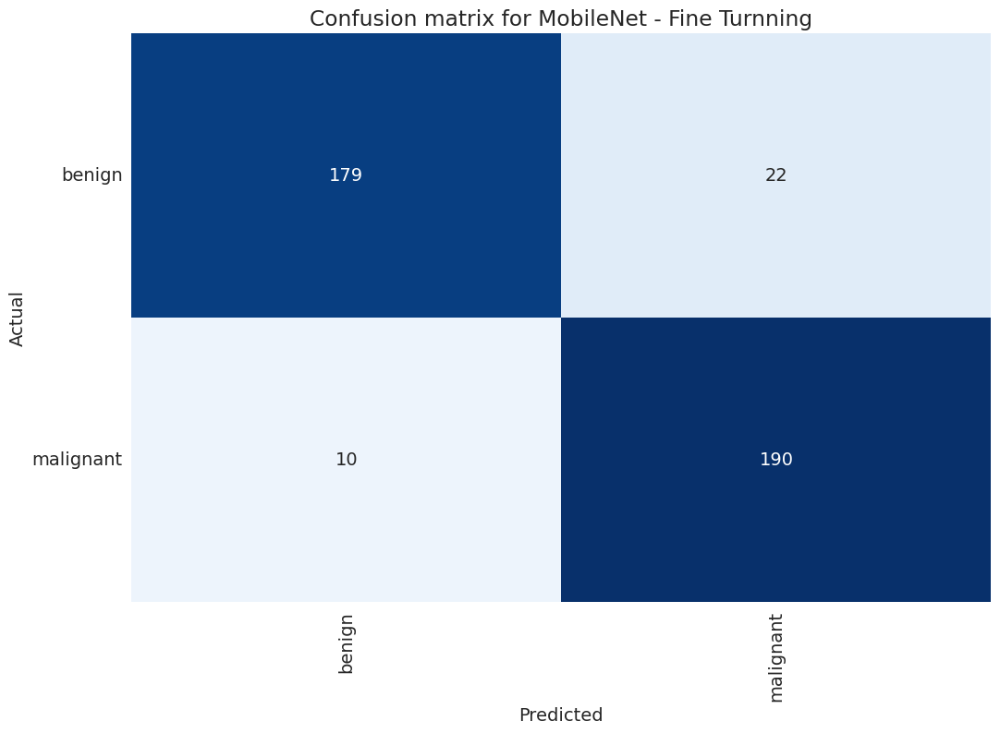

Saved history completed.
           loss  accuracy  val_loss  val_accuracy
Epoch                                            
0      0.309778  0.867436  0.660378      0.755611
1      0.295109  0.882096  0.479720      0.755611
2      0.290435  0.881472  0.465695      0.798005
3      0.306507  0.867436  0.605441      0.805486
4      0.247915  0.902994  0.459671      0.802993
...         ...       ...       ...           ...
58     0.089943  0.963506  0.345531      0.900249
59     0.060654  0.975047  0.427990      0.897756
60     0.065671  0.970056  0.460608      0.887781
61     0.067703  0.975047  0.460847      0.895262
62     0.120500  0.954772  0.456516      0.875312

[63 rows x 4 columns]
==========GRADCAM after fine tuning==========
Label: benign.
1/1 [==============================] - 1s 566ms/step


/tmp/ipykernel_27/3772978291.py:45: RuntimeWarning: invalid value encountered in divide
  cam = cam / np.max(cam)
/tmp/ipykernel_27/3772978291.py:56: RuntimeWarning: invalid value encountered in cast
  cam3 = np.uint8(255 * cam3)


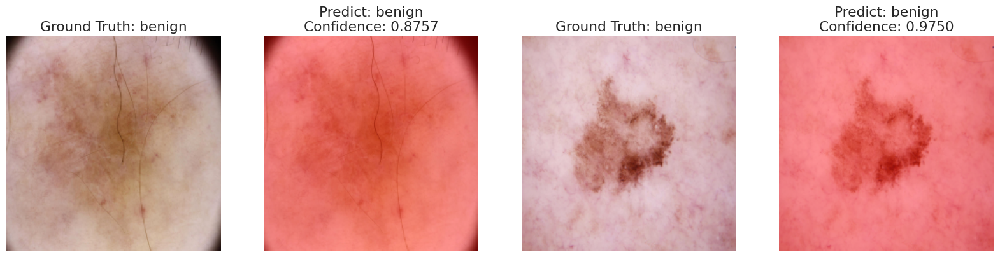

Label: malignant.
1/1 [==============================] - 0s 21ms/step


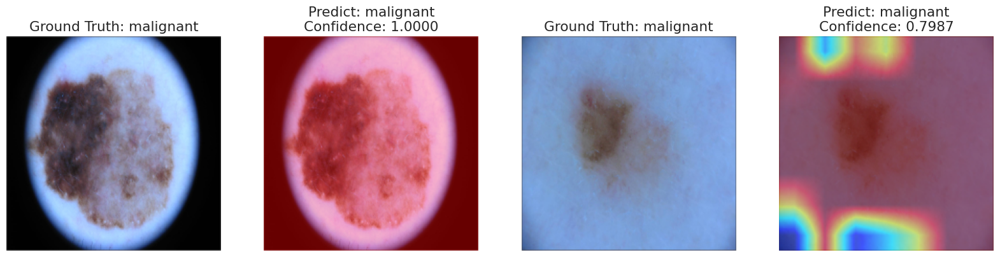

==========End Process with model MobileNet==========




In [30]:
last_models = dict()

for model_name, Model in initial_models.items():
    
    base_model = Model(**initial_models_kwargs[model_name])
    base_model.trainable = False

    sequence_layers = [
        base_model,
        layers.BatchNormalization(),
        layers.Dropout(0.15),
    ]

    if USE_HIDDEN_LAYERS:
        for i, units in enumerate(HIDDEN_LAYERS):
            sequence_layers.append(layers.Dense(units, activation='relu'))
            sequence_layers.append(layers.BatchNormalization())
            sequence_layers.append(layers.Dropout(0.1))
            

    sequence_layers.append(layers.Dense(num_classes, activation='softmax'))

    output = sequence_layers[0].layers[-1].output
    for layer in sequence_layers[1:]:
        output = layer(output)
    
    model = tf.keras.models.Model(base_model.inputs, output, name=model_name)
    
#     model = Sequential(sequence_layers)

    print(f'\n\n ==========Start Process with model {model_name}=========')
    model.summary()

    history, model, best_acc_ph1, y_pred = transfer_learning(model, model_name)
    calculate_metrics(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, classes, title=f"Confusion matrix for {model_name} - Transfer Learning")
    
    save_history(history.history, f"{model_name}-{dataset_name}-transfer-results.csv")
    
    visualize_gradcam(model, "==========GRADCAM after transfer learning==========")
    
    best_acc = best_acc_ph1
    if best_acc_ph1 < 1:
        history, model, best_acc_ph2, y_pred = fine_turning(model, model_name, best_acc_ph1)
        calculate_metrics(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)
        plot_confusion_matrix(cm, classes, title=f"Confusion matrix for {model_name} - Fine Turnning")
        save_history(history.history, f"{model_name}-{dataset_name}-fine-tuning-results.csv")
        visualize_gradcam(model, "==========GRADCAM after fine tuning==========")
        
    else:
        print('Transfer learning have 100% accuracy so no need to do fine-turning.')

    print(f'==========End Process with model {model_name}==========\n\n')
    
    last_models[model_name] = model

# Test and Visualize Results

In [31]:
k = 5
n = len(y_test)
sample_idx = np.random.choice(range(n), k)
x_sample = x_test[sample_idx]
y_sample = y_test[sample_idx]
y_sample

array([1, 0, 0, 0, 0])



Prediction for ResNet50V2 model
1/1 [==============================] - 1s 910ms/step


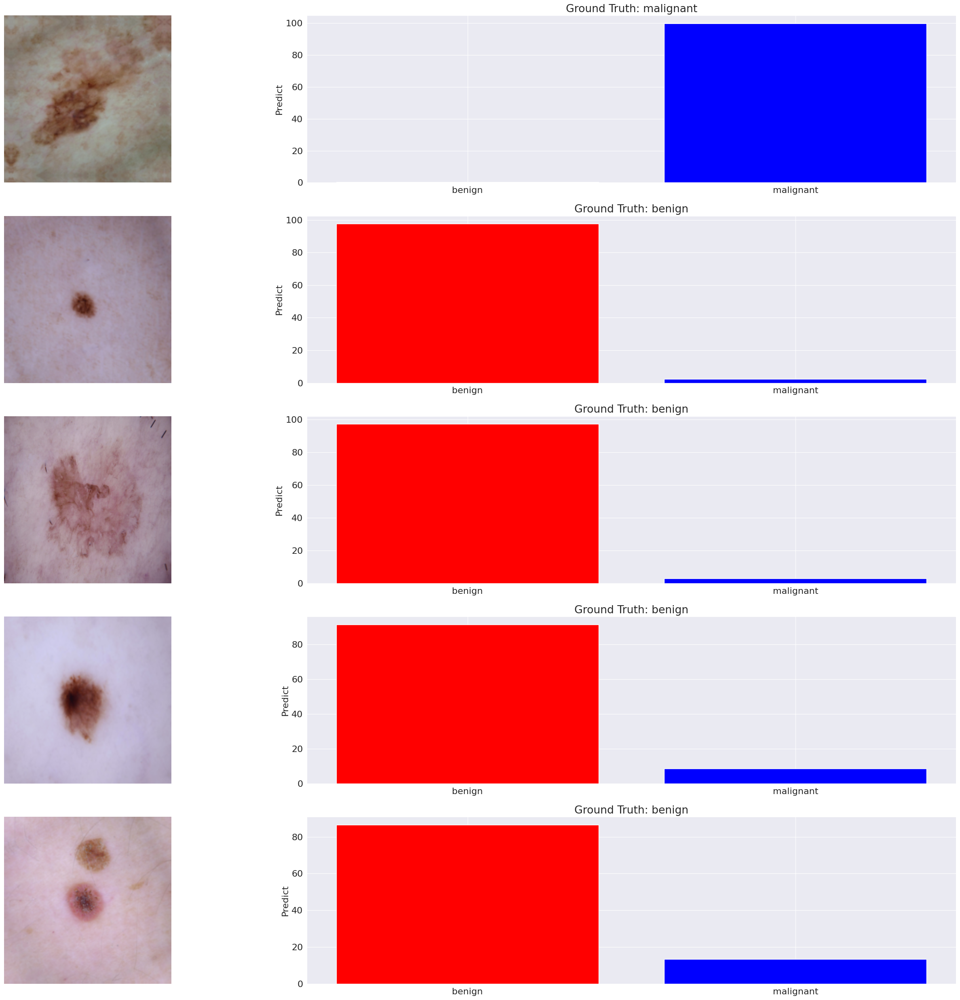



Prediction for MobileNetV2 model
1/1 [==============================] - 1s 577ms/step


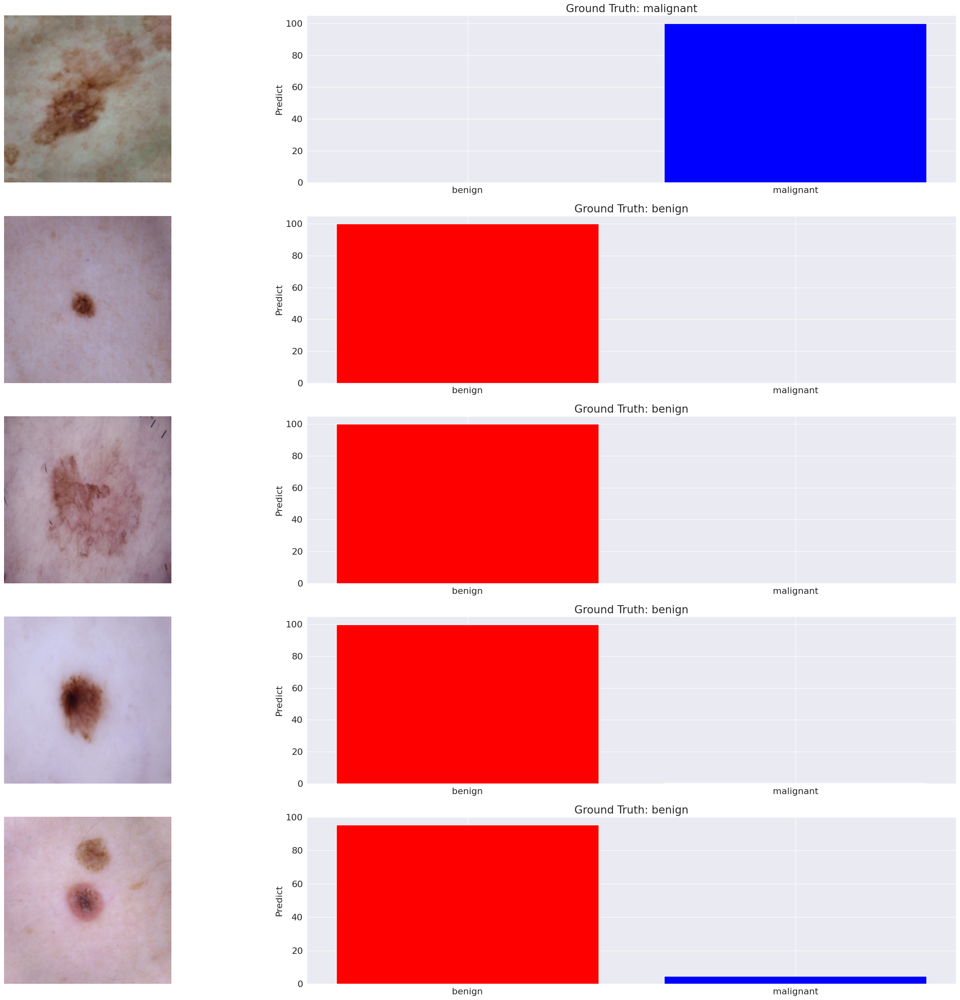



Prediction for MobileNet model
1/1 [==============================] - 0s 296ms/step


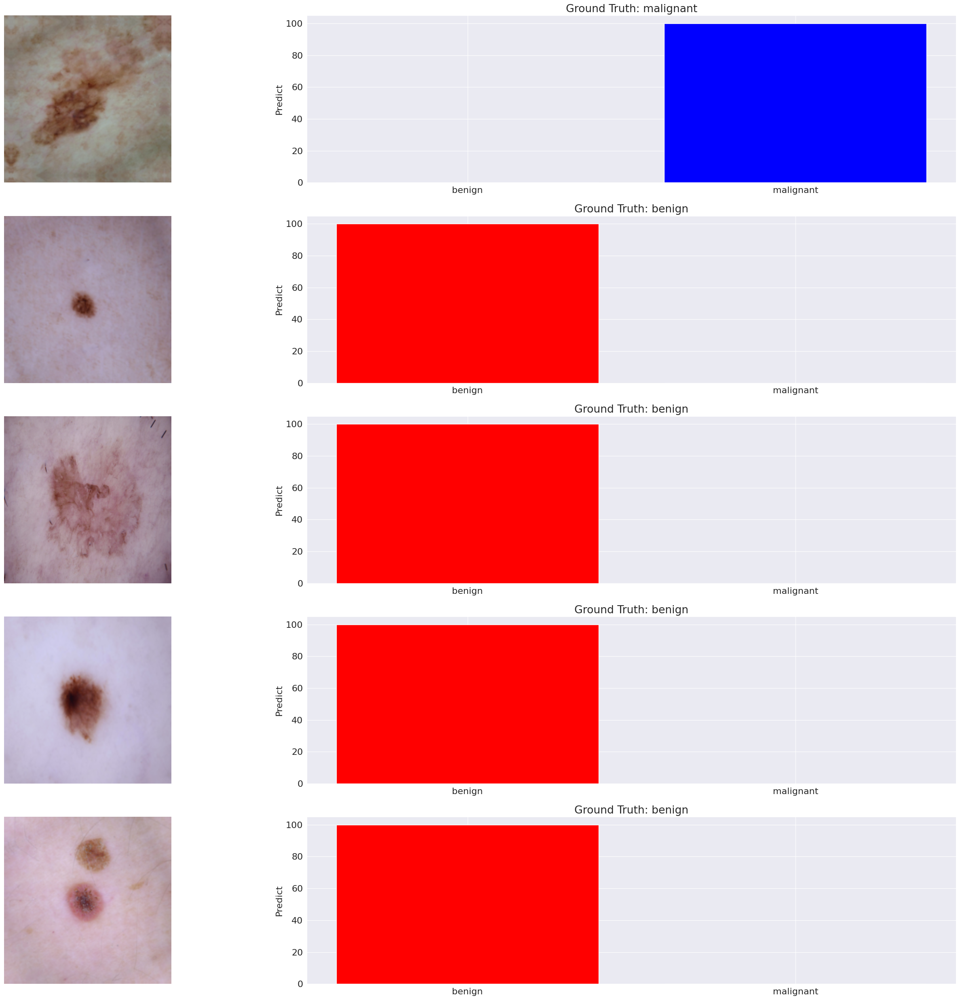

In [32]:
plt.rcParams.update({'font.size': 16})

def format_label(label):
    return '\n'.join(label.split())

short_labels = list(map(format_label, classes))
for model_name, model in last_models.items():
    print("\n\nPrediction for {} model".format(model_name))
    y_pred = model.predict(x_sample)
    fig, ax = plt.subplots(k, 2, figsize=(30, 25))
    
    for i in range(k):
        acc = y_pred[i] * 100
        bar_colors = ['red', 'blue', 'green', 'orange', 'purple', 'gray', 'magenta']
        ax[i, 0].imshow(x_sample[i] / 255)
        ax[i, 0].axis('off')
        ax[i, 1].bar(short_labels, acc, label=short_labels, color=[bar_colors[i % len(bar_colors)] for i in range(num_classes)])
        ax[i, 1].set_ylabel('Predict')
        ax[i, 1].set_title('Ground Truth: {}'.format(classes[y_sample[i]]))

    plt.tight_layout()
    plt.show()

In [33]:
for model_name, model in last_models.items():
    y_pred = np.argmax(model.predict(x_test), axis=1)
    print("Classification Report for {}".format(model_name))
    print(classification_report(y_test, y_pred, target_names=classes))

13/13 [==============================] - 1s 52ms/step
Classification Report for ResNet50V2
              precision    recall  f1-score   support

      benign       0.91      0.92      0.92       201
   malignant       0.92      0.91      0.91       200

    accuracy                           0.92       401
   macro avg       0.92      0.92      0.92       401
weighted avg       0.92      0.92      0.92       401

13/13 [==============================] - 0s 27ms/step
Classification Report for MobileNetV2
              precision    recall  f1-score   support

      benign       0.89      0.89      0.89       201
   malignant       0.89      0.89      0.89       200

    accuracy                           0.89       401
   macro avg       0.89      0.89      0.89       401
weighted avg       0.89      0.89      0.89       401

13/13 [==============================] - 0s 25ms/step
Classification Report for MobileNet
              precision    recall  f1-score   support

      benign      

# K-Mean Clustering for Segmentation Diseases Mask

In [34]:
!pip install rembg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 72.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.5 MB/s eta 0:00:00


100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 160GB/s]
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


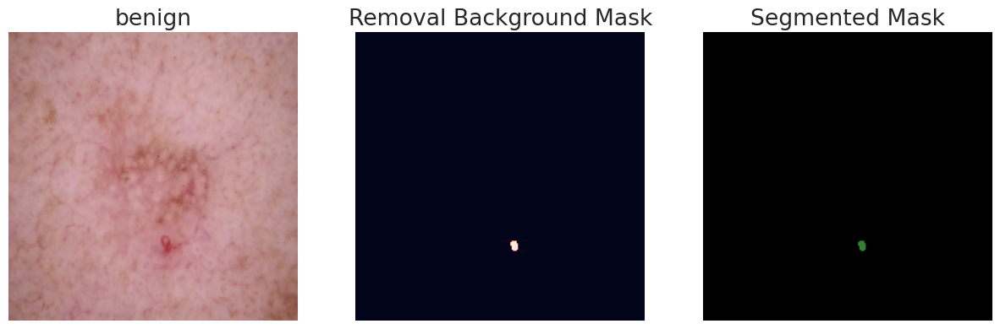

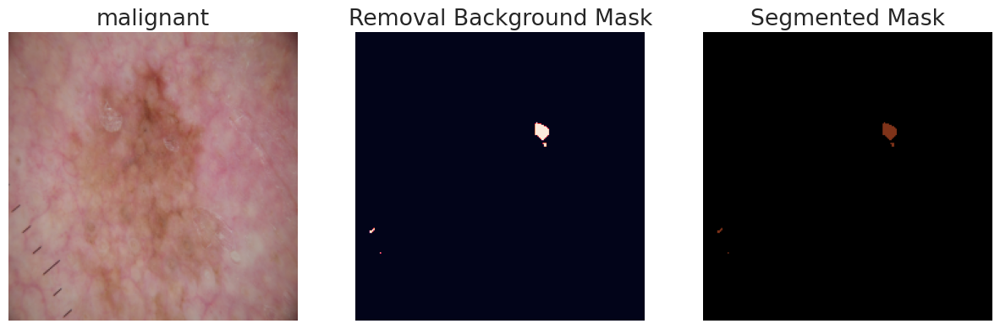

In [35]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import rembg, random

n_clusters=3

# random.seed(42)
batch = [random.choices(data_dict[lab], k=1)[0] for lab in data_dict]

for i, img in enumerate(batch):
    w, h, channel = img.shape
    # Reshape X into tensor2D: (width x heigth, n_channels)
    removal = rembg.remove(img, )
    X_bg_removal = removal[:,:,:3]
    _, object_mask = cv2.threshold(removal[:,:,3], 127, 255, cv2.THRESH_BINARY)
    X = np.reshape(X_bg_removal, (w * h, channel))
    
    # Kmeans clustering with 3 clusters
    kmeans = KMeans(n_clusters, random_state=0).fit(X)

    pred_label = kmeans.predict(X)
    pred_label = np.reshape(pred_label, (h, w))

    mask = np.zeros(shape=(h, w, channel))
    mask_colors = [
        (0.1, 0.2, 0.5),
        (0.2, 0.5, 0.2),
        (0.5, 0.2, 0.1),
        (0, 0, 0)
    ]

    # Display image clustering
    fg, ax = plt.subplots(1, 3, figsize = (15, 5))
    
    ax[0].imshow(img / 255)
    ax[0].set_title(f"{classes[i]}")
    ax[0].axis('off')
    
    ax[1].imshow(object_mask / 255)
    ax[1].set_title("Removal Background Mask")
    ax[1].axis('off')
    
    for i in range(n_clusters):
        mask[pred_label == i] = mask_colors[i]
    
    mask[object_mask == 0] = mask_colors[-1]
    ax[2].imshow(mask)
    ax[2].set_title(f'Segmented Mask')
    ax[2].axis('off')
    
#     break